# Seminario de proyectos II 

## Unidad 3. Actividad 3B. Resumen. Análisis exploratorio de datos

#### Claudio Daniel Pacheco Castro

### Introducción<br>
El presente documento muestra el desarrollo de la descarga de información así como de la limpieza de la misma para poder contar con datos que, posteriormente, se puedan utilizar para la definición de un modelo de clasificación.
### Desarrollo de la actividad<br>
#### Importar las librerías necesarias

In [18]:
import os
import pandas as pd
from matplotlib import pyplot as plt
import rasterio
from rasterio.plot import show
from skimage import exposure

In [19]:
#Establecer directorio de trabajo
try:
    os.chdir('D:/github/proyecto_infotec')
except:
    os.chdir('C:/users/claudio.pacheco/Documents/Github/proyecto_infotec')

### Análisis exploratorio de los datos del Censo de Población y Vivienda

In [20]:
#Cargar datos
df_limpia = pd.read_csv('datos/df_limpia.csv')

El primer conjunto de datos, que corresponde a aquellos que provienen del Cuestionario Ampliado cuenta con 62 columnas y 1,305,275 registros.

In [21]:
df_limpia

,cvegeo,entidad,nom_ent,mun,nom_mun,loc,nom_loc,ageb,mza,vivtot,...,vph_telef,vph_cel,vph_inter,vph_stvp,vph_spmvpi,vph_cvj,vph_sinrtv,vph_sinltc,vph_sincint,vph_sintic
0,0100100010017001,1,Aguascalientes,1,Aguascalientes,1,Aguascalientes,0017,1,82,...,NaN,98.148148,24.074074,61.111111,9.259259,9.259259,0.000000,NaN,66.666667,0.0
1,0100100010017002,1,Aguascalientes,1,Aguascalientes,1,Aguascalientes,0017,2,83,...,NaN,100.000000,26.923077,59.615385,NaN,9.615385,0.000000,0.00,59.615385,0.0
2,0100100010017003,1,Aguascalientes,1,Aguascalientes,1,Aguascalientes,0017,3,84,...,NaN,96.363636,25.454545,54.545455,9.090909,9.090909,7.272727,NaN,63.636364,0.0
3,0100100010017004,1,Aguascalientes,1,Aguascalientes,1,Aguascalientes,0017,4,84,...,NaN,96.491228,35.087719,59.649123,15.789474,8.771930,NaN,NaN,57.894737,0.0
4,0100100010017005,1,Aguascalientes,1,Aguascalientes,1,Aguascalientes,0017,5,68,...,0.0,93.750000,43.750000,50.000000,10.416667,12.500000,NaN,6.25,45.833333,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1305270,3205800010123007,32,Zacatecas,58,Santa María de la Paz,1,Santa María de la Paz,0123,7,8,...,NaN,100.000000,NaN,NaN,NaN,0.000000,0.000000,0.00,66.666667,0.0
1305271,3205800010123010,32,Zacatecas,58,Santa María de la Paz,1,Santa María de la Paz,0123,10,6,...,NaN,100.000000,100.000000,0.000000,NaN,0.000000,0.000000,0.00,0.000000,0.0
1305272,3205800010123013,32,Zacatecas,58,Santa María de la Paz,1,Santa María de la Paz,0123,13,13,...,NaN,100.000000,NaN,72.727273,0.000000,0.000000,0.000000,0.00,81.818182,0.0
1305273,3205800010123017,32,Zacatecas,58,Santa María de la Paz,1,Santa María de la Paz,0123,17,5,...,0.0,NaN,0.000000,NaN,0.000000,0.000000,0.000000,NaN,100.000000,0.0


In [22]:
#Contar el número de variables de vivienda del iloc 20 al final
print("El conjunto de datos tiene ", len(df_limpia.iloc[:,20:].columns), " variables relacionadas con la vivienda")

El conjunto de datos tiene  42  variables relacionadas con la vivienda


Las variables de vivienda son las siguientes:

In [23]:
#Cargar catálogo 
cat=pd.read_excel('var_vivi.xlsx')

cat['nom_dato']=cat['nom_dato'].str.lower()
cat

,num,ind,desc,nom_dato,rango,long
0,235,Viviendas particulares habitadas con piso de m...,Viviendas particulares habitadas con piso de c...,vph_pisodt,0...999999999,9
1,236,Viviendas particulares habitadas con piso de t...,Viviendas particulares habitadas con piso de t...,vph_pisoti,0...999999999,9
2,237,Viviendas particulares habitadas con un dormit...,Viviendas particulares habitadas con un dormit...,vph_1dor,0… 999999999,9
3,238,Viviendas particulares habitadas con dos dormi...,Viviendas particulares habitadas que usan para...,vph_2ymasd,0…999999999,9
4,239,Viviendas particulares habitadas con sólo un c...,Viviendas particulares habitadas que tienen só...,vph_1cuart,0…999999999,9
5,240,Viviendas particulares habitadas con dos cuartos,Viviendas particulares habitadas que tienen do...,vph_2cuart,0…999999999,9
6,241,Viviendas particulares habitadas con 3 cuartos...,Viviendas particulares habitadas que tienen en...,vph_3ymasc,0…999999999,9
7,242,Viviendas particulares habitadas que disponen ...,Viviendas particulares habitadas que tienen en...,vph_c_elec,0…999999999,9
8,243,Viviendas particulares habitadas que no dispon...,Viviendas particulares habitadas que no tienen...,vph_s_elec,0…999999999,9
9,244,Viviendas particulares habitadas que disponen ...,Viviendas particulares habitadas que tienen di...,vph_aguadv,0…999999999,9


Text(0.99, 0.01, 'Fuente: INEGI. Censo de Población y Vivienda 2020. Microdatos. https://www.inegi.org.mx/programas/ccpv/2020/#Microdatos')

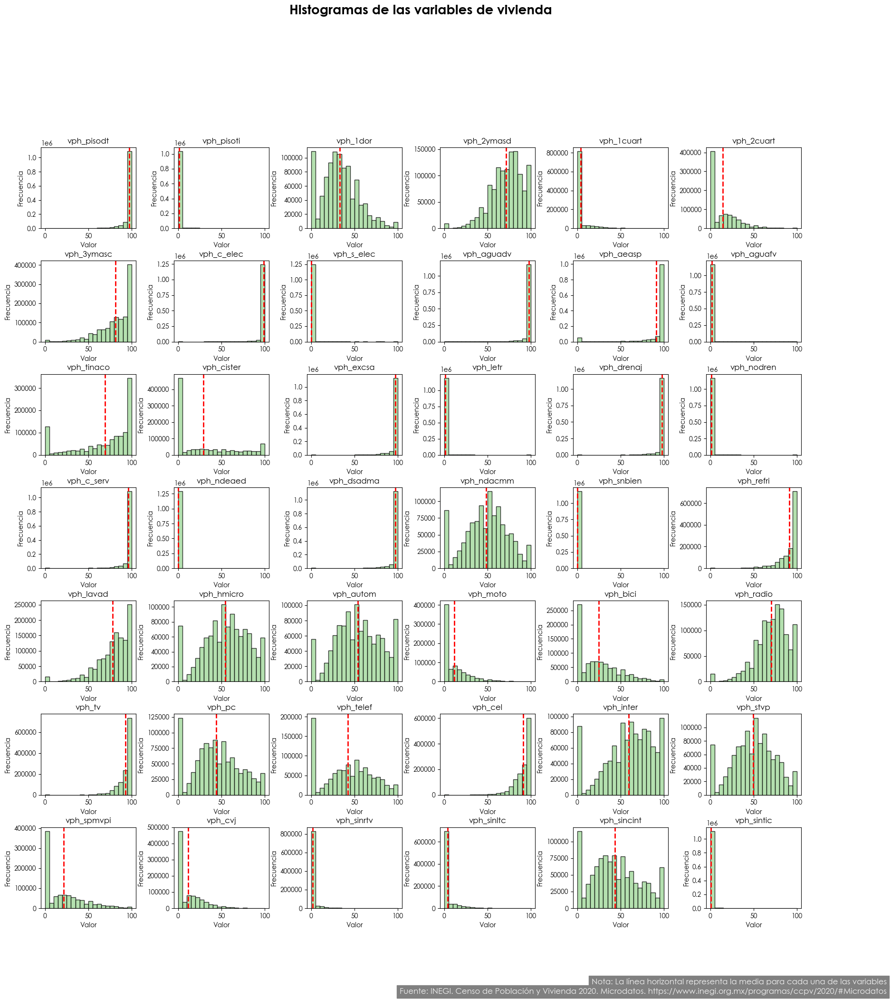

In [24]:
#Fuente
plt.rcParams['font.family'] = 'Century Gothic'

# Media de cada variable
means = df_limpia.iloc[:,20:].mean()

# Gráfico
fig, axs = plt.subplots(7, 6, figsize=(20,20))

axs = axs.flatten()
for i, col in enumerate(df_limpia.iloc[:,20:].columns):
    axs[i].hist(df_limpia[col], bins=20, color='#a1d99b', edgecolor='black', linewidth=1.0, alpha=0.8)
    axs[i].axvline(means[i], color='red', linestyle='dashed', linewidth=2)
    axs[i].set_title(col)
    axs[i].set_xlabel('Valor')
    axs[i].set_ylabel('Frecuencia')

for i in range(len(df_limpia.iloc[:,20:].columns), len(axs)):
    fig.delaxes(axs[i])

# Título y notas
fig.suptitle("Histogramas de las variables de vivienda", fontsize=20, fontweight='bold', y=1.05)
plt.subplots_adjust(left=0.1, right=0.9, bottom=0.1, top=0.9, wspace=0.4, hspace=0.4)
plt.figtext(0.99, 0.02, 'Nota: La línea horizontal representa la media para cada una de las variables', horizontalalignment='right', fontsize=12, color='#f0f0f0', backgroundcolor='grey')
plt.figtext(0.99, 0.01, 'Fuente: INEGI. Censo de Población y Vivienda 2020. Microdatos. https://www.inegi.org.mx/programas/ccpv/2020/#Microdatos', horizontalalignment='right', fontsize=12, color='#f0f0f0', backgroundcolor='grey')


C:\Users\claudio.pacheco\AppData\Local\Temp\ipykernel_20188\3848924137.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(nrows=7, ncols=6, figsize=(20, 20))


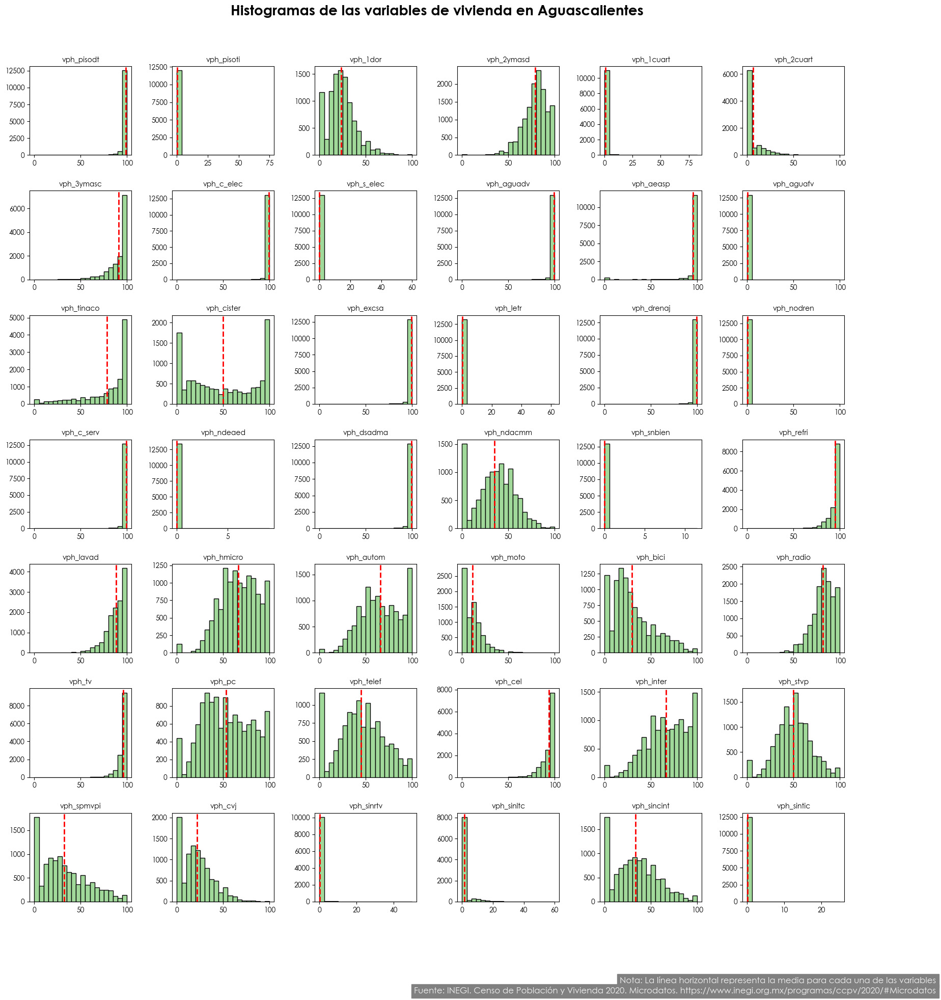

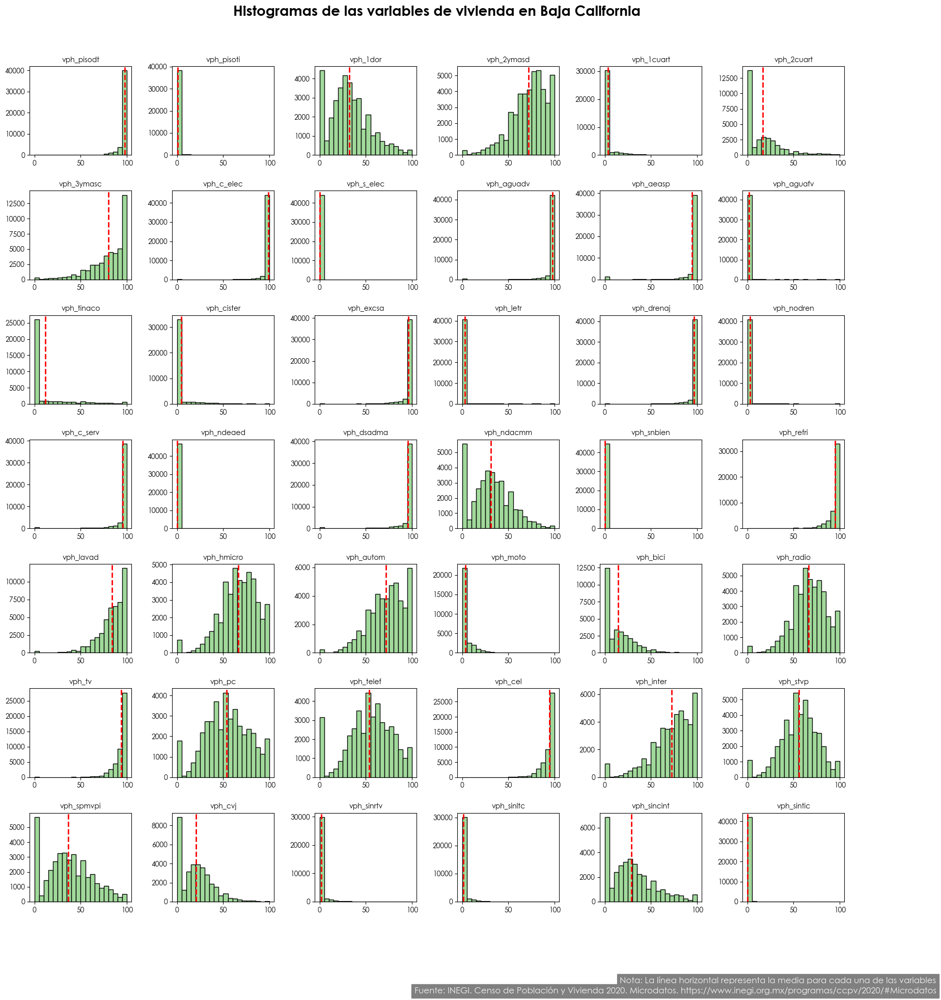

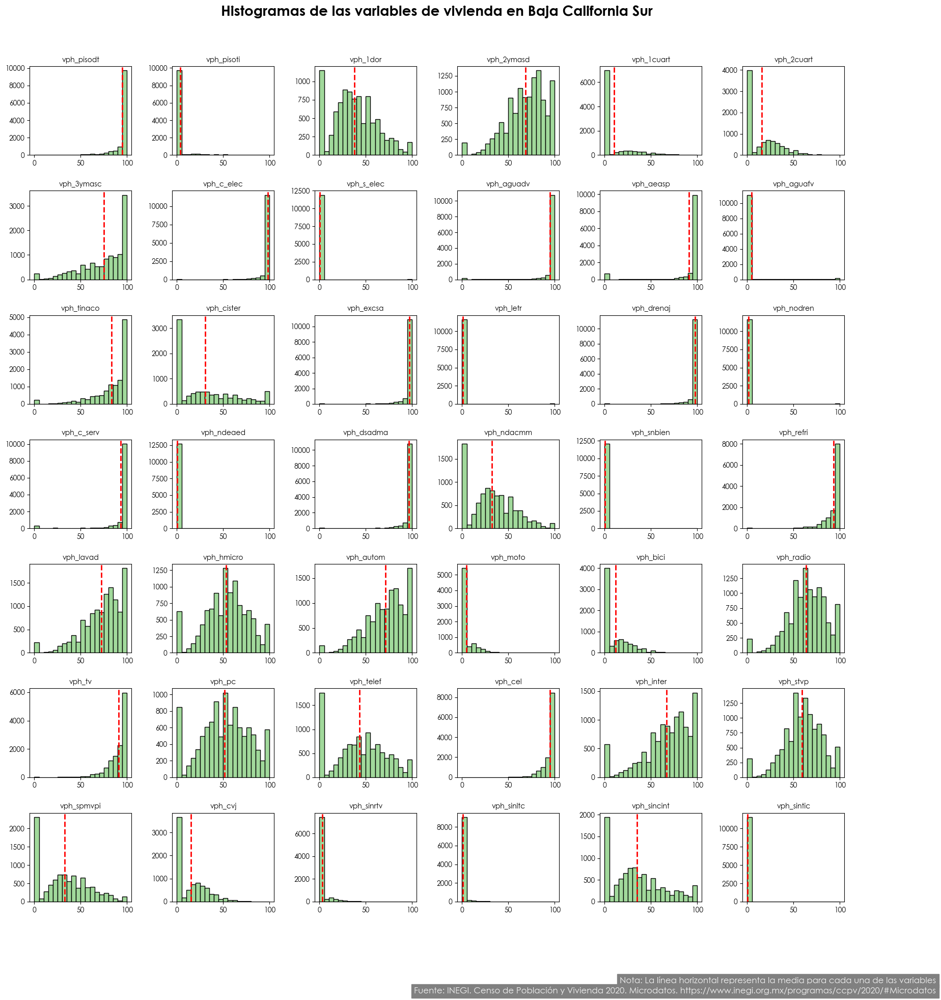

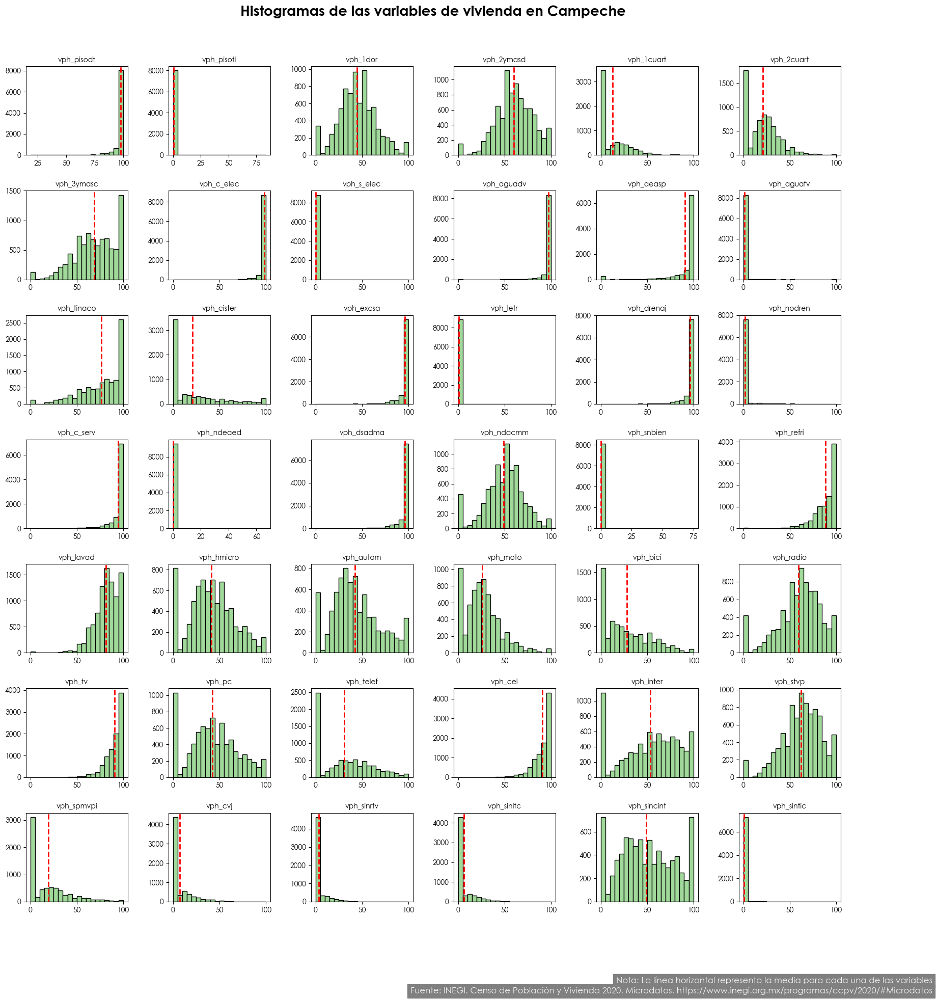

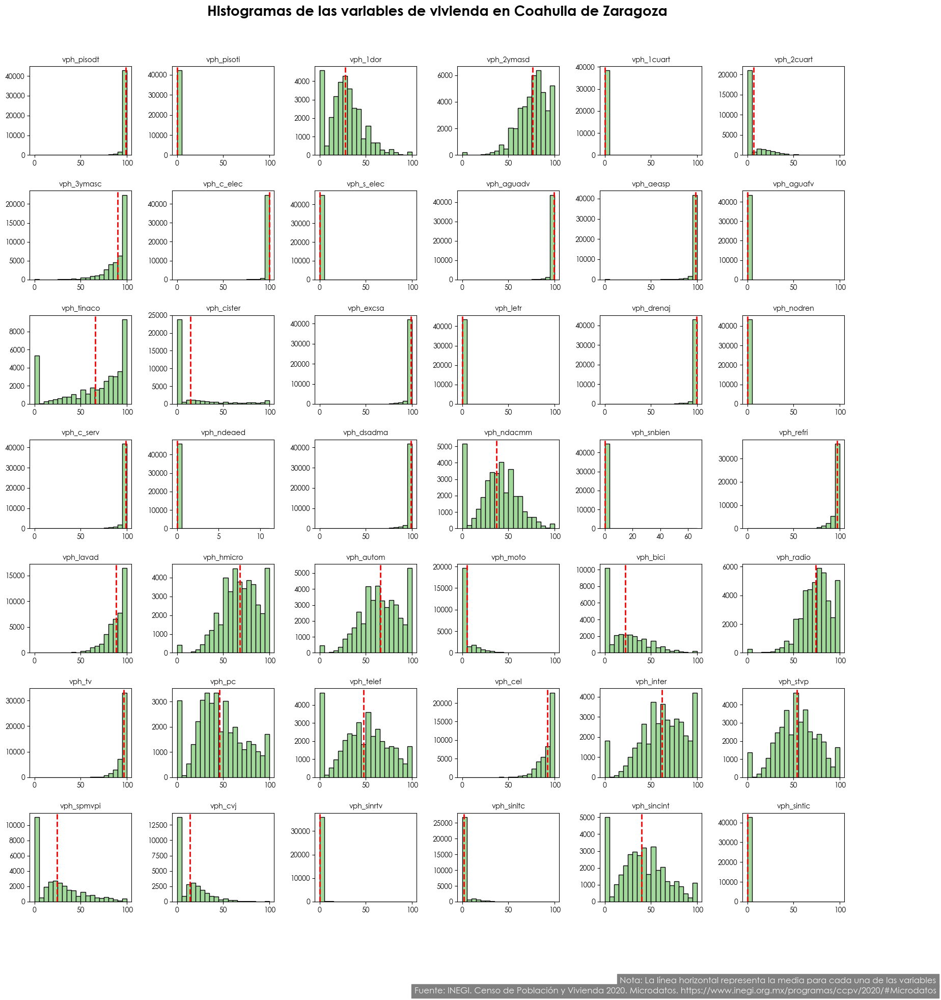

...

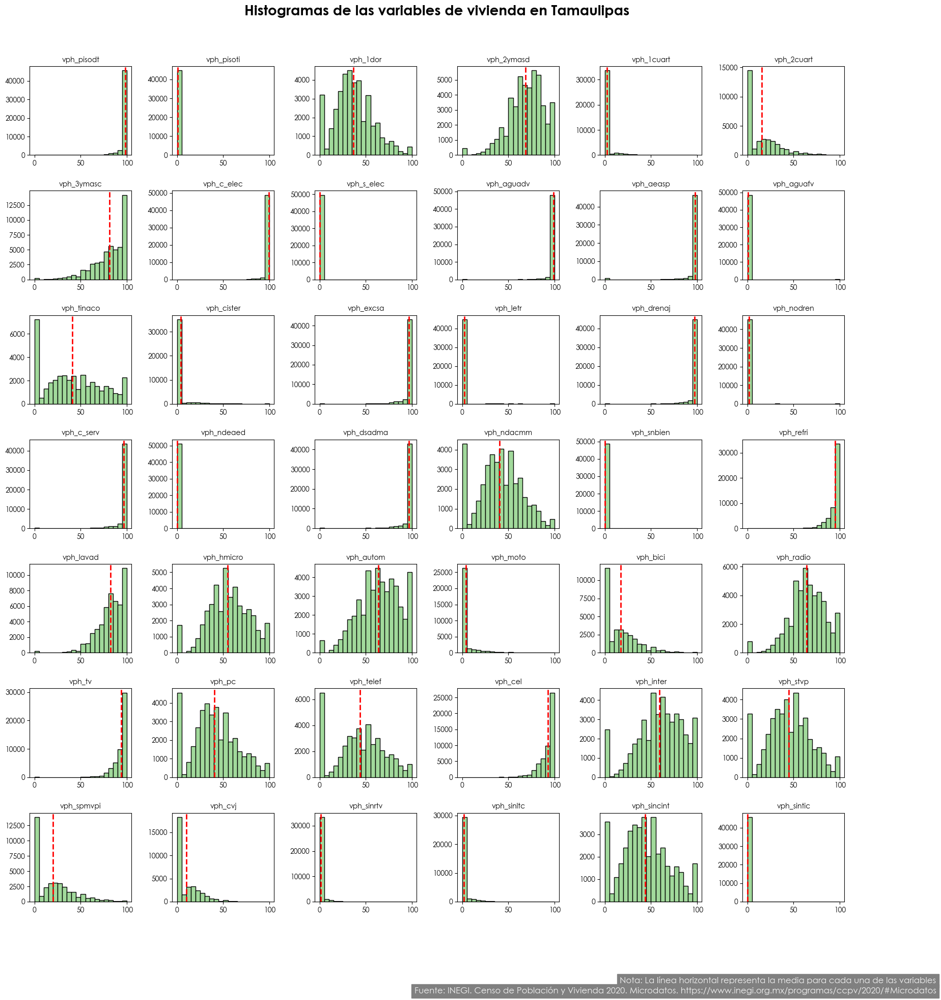

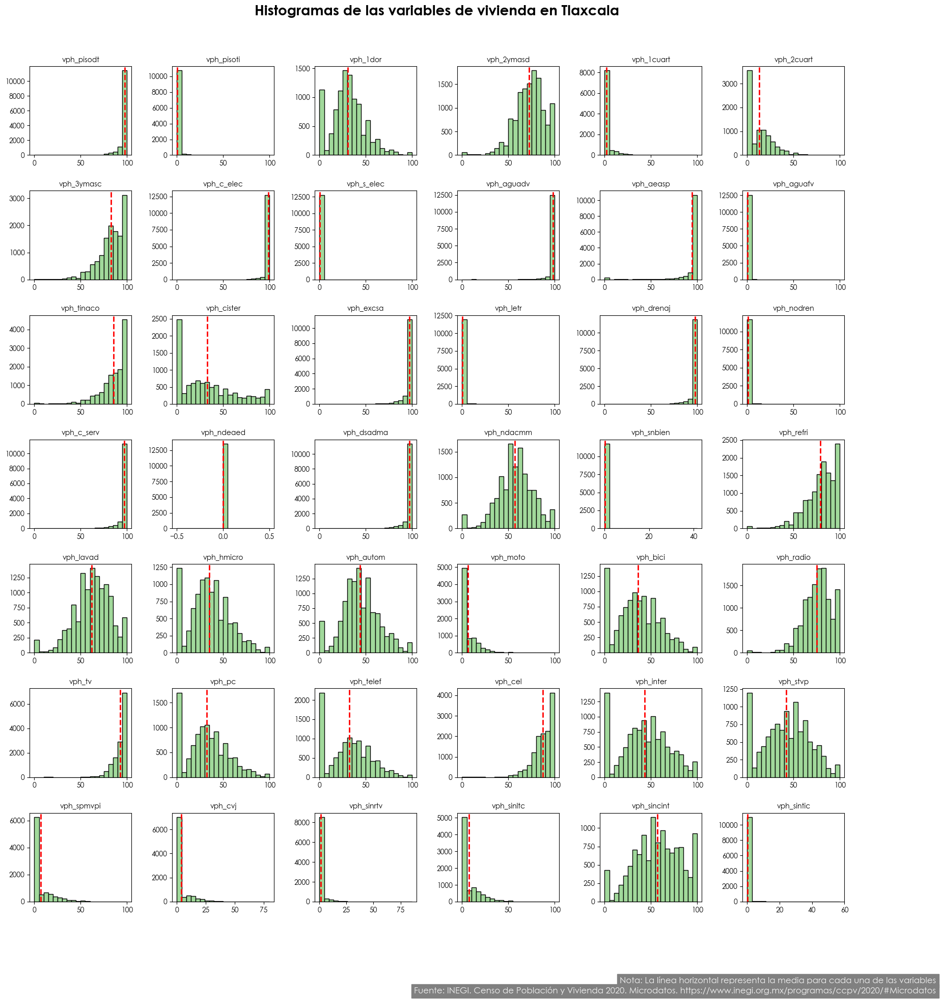

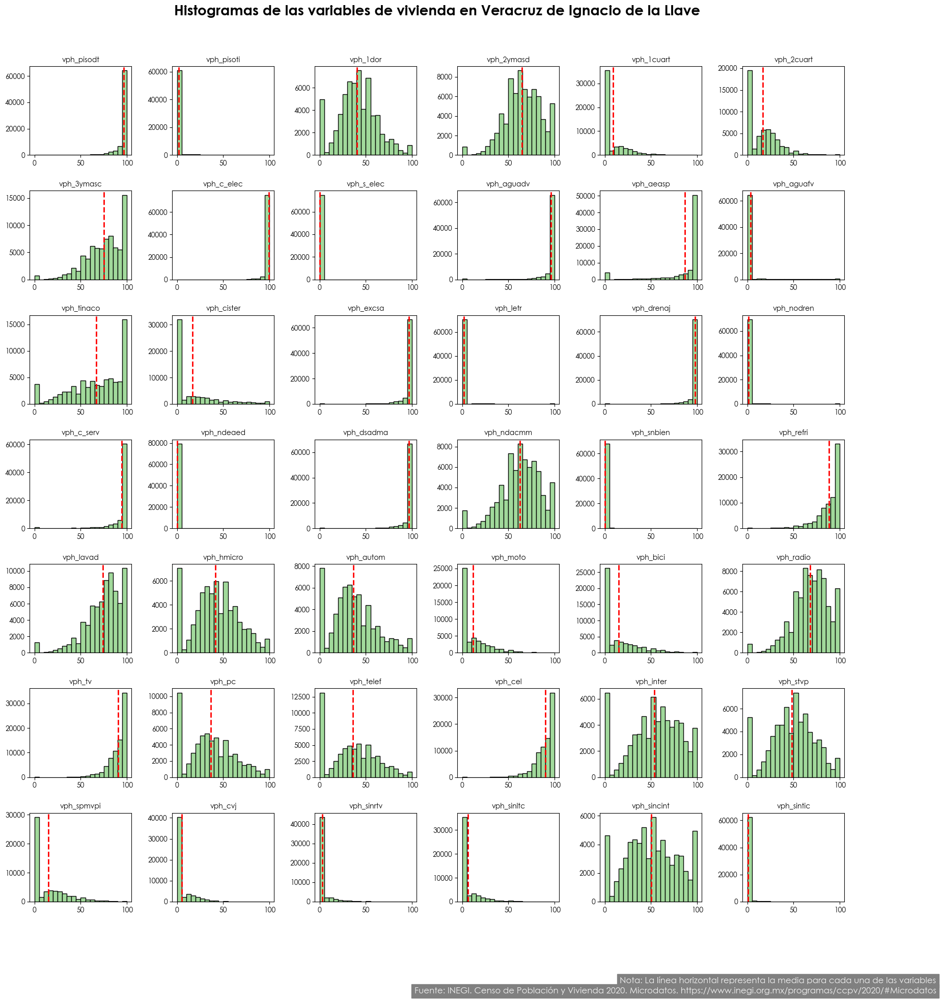

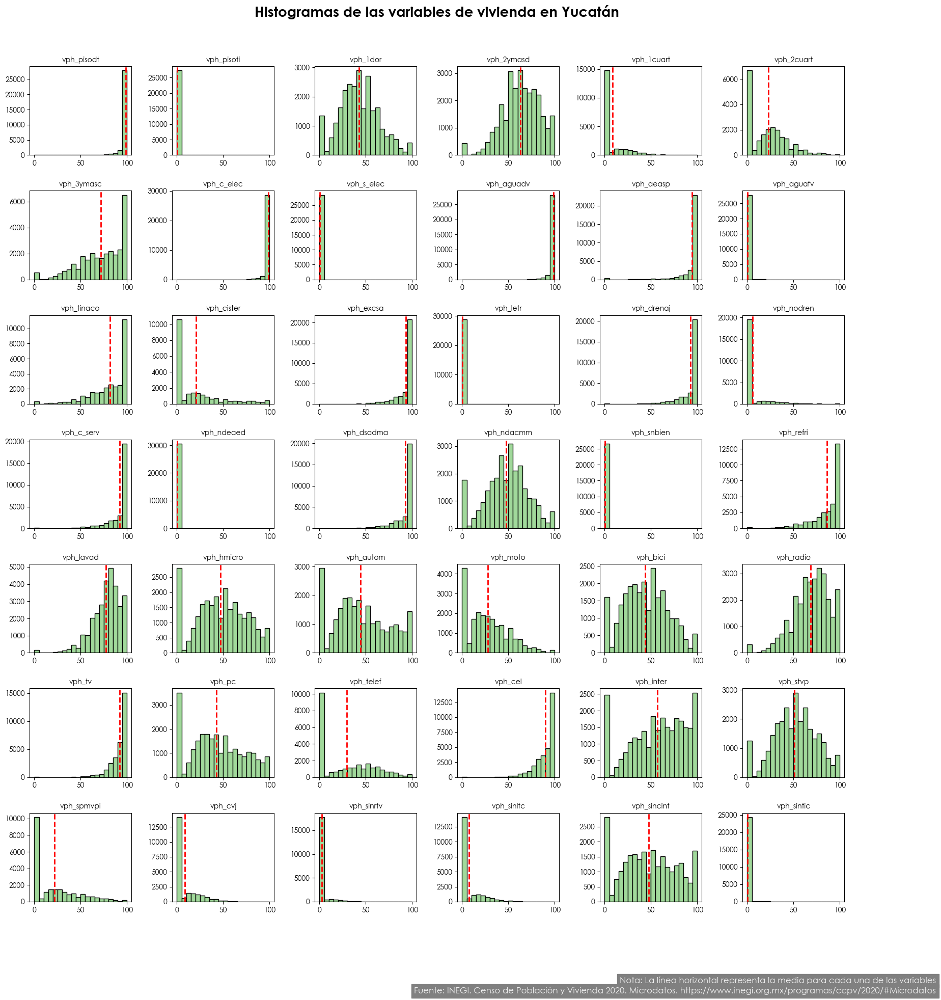

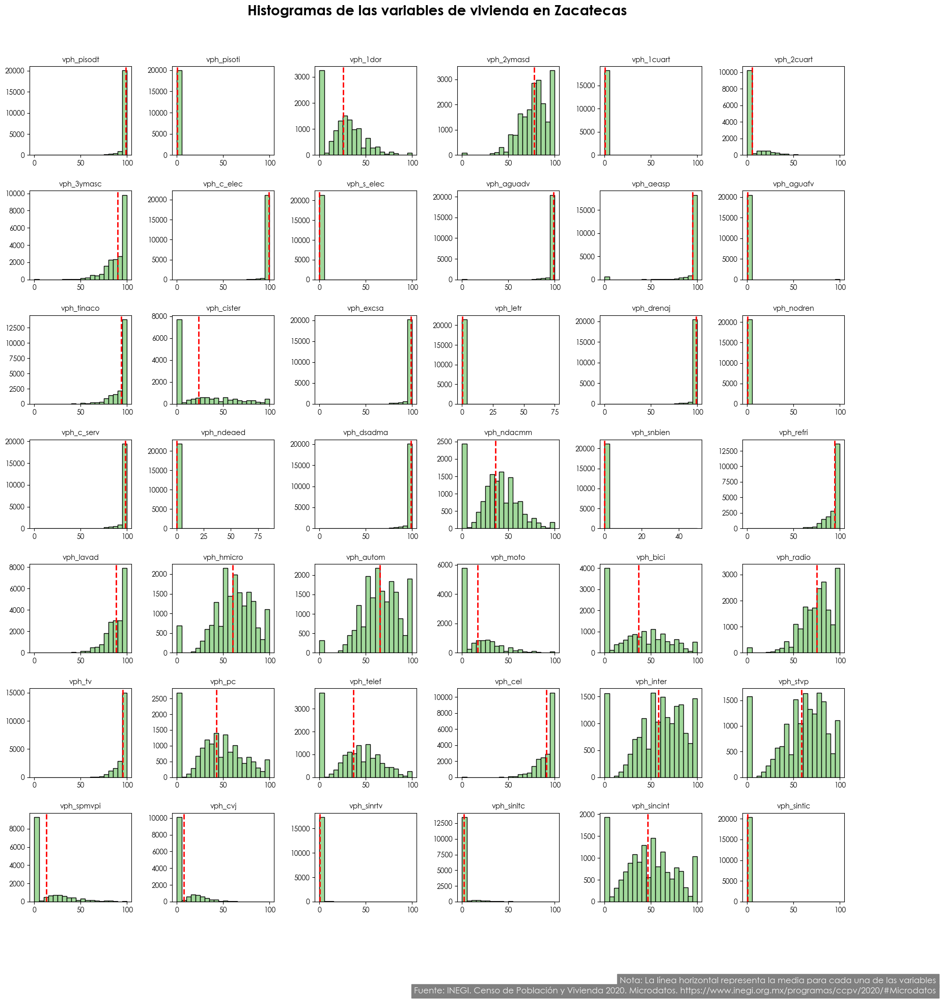

In [25]:
#Histgramas d evariables de vivienda por entidad federativa
for i in df_limpia['nom_ent'].unique():
    ent_df = df_limpia[df_limpia['nom_ent']==i]
    means = ent_df.iloc[:, 20:].mean()
    fig, axs = plt.subplots(nrows=7, ncols=6, figsize=(20, 20))
    fig.suptitle("Histogramas de las variables de vivienda en " + i, fontsize=20, fontweight='bold')
    for col, ax in zip(ent_df.iloc[:, 20:].columns, axs.flatten()):
        ax.hist(ent_df[col], bins=20, color='#a1d99b', edgecolor='black', linewidth=1.0)
        ax.axvline(means[col], color='red', linestyle='dashed', linewidth=2)
        ax.set_title(col, fontsize=10)
    fig.tight_layout()
    fig.subplots_adjust(top=0.92, wspace=0.4, hspace=0.4, left=0.1, right=0.9, bottom=0.1)
    #Fuente y notas
    plt.figtext(0.99, 0.02, 'Nota: La línea horizontal representa la media para cada una de las variables', horizontalalignment='right', fontsize=12, color='#f0f0f0', backgroundcolor='grey')
    plt.figtext(0.99, 0.01, 'Fuente: INEGI. Censo de Población y Vivienda 2020. Microdatos. https://www.inegi.org.mx/programas/ccpv/2020/#Microdatos', horizontalalignment='right', fontsize=12, color='#f0f0f0', backgroundcolor='grey')

### Análisis exploratorio de las imágenes satelitales

In [26]:
#Cambiar directorio de trabajo
os.chdir('C:/Users/claudio.pacheco/Documents/GitHub/proyecto_infotec/datos/imagenes/datos/imagenes')

In [27]:
#Enlistar carpetas
folders = os.listdir('.')
#Enlistar imágenes de cada carpeta
images = []
for folder in folders:
    images.append(os.listdir(folder))

In [28]:
folders

['aguascalientes',
 'baja_california',
 'baja_california_sur',
 'campeche',
 'cdmx',
 'chiapas',
 'chihuahua',
 'coahuila',
 'colima',
 'durango',
 'guanajuato',
 'guerrero',
 'hidalgo',
 'jalisco',
 'mexico',
 'michoacan',
 'morelos',
 'nayarit',
 'nuevo_leon',
 'oaxaca',
 'puebla',
 'queretaro',
 'quintana_roo',
 'san_luis_potosi',
 'sinaloa',
 'sonora',
 'tabasco',
 'tamaulipas',
 'tlaxcala',
 'veracruz',
 'yucatan',
 'zacatecas']

In [29]:
#Reproyectar imágenes
for folder, image in zip(folders, images):
    for img in image:
        with rasterio.open(folder + '/' + img) as src:
            data = src.read(
            out_shape=(
                src.count,
                int(src.height * 0.5),
                int(src.width * 0.5)
            ),
            resampling=rasterio.enums.Resampling.bilinear
        )
        transform = src.transform * src.transform.scale(
            (src.width / data.shape[-1]),
            (src.height / data.shape[-2])
        )
        with rasterio.open(folder + '/' + img, 'w', driver='GTiff', height=data.shape[1], width=data.shape[2], count=data.shape[0], dtype=data.dtype, crs=crs, transform=transform) as dst:
            dst.write(data)
            

NameError: name 'crs' is not defined

In [ ]:
#normalizar imágenes
normalized_images = []
for folder, image in zip(folders, images):
    for img in image:
        normalized_images.append(exposure.rescale_intensity(rasterio.open(folder + '/' + img).read(1), out_range=(0, 1)).astype('float'))
 

In [ ]:
#Dejar solo los arreglos que sean 6,7
normalized_images = [x for x in normalized_images if x.shape == (6,7)]
normalized_images=np.array(normalized_images)

In [ ]:
#Estadistica descriptiva de todo el arreglo
print('Media: ', np.mean(normalized_images), 'Desviación estándar: ', np.std(normalized_images), 'Mínimo: ', np.min(normalized_images), 'Máximo: ', np.max(normalized_images))

In [ ]:
plt.figure(figsize=(10, 10))
plt.hist(normalized_images.flatten(), bins=20, color='red')
plt.title('Histograma de valores de las imágenes', fontsize=20, fontweight='bold')
#Eliminar marcos
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)